Analyzing the Conversion Rate of a Bank's Marketing Campaign

In [1]:
import pandas as pd
bank_mark_df = pd.read_csv('bank_campaign.csv', sep=';')
bank_mark_df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [18]:
bank_mark_df.shape

(41188, 21)

In [19]:
bank_mark_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [20]:
print ("\nMissing values :  ", bank_mark_df.isnull().sum().values.sum())


Missing values :   0


In [21]:
bank_mark_df['y'].value_counts(sort = False)

no     36548
yes     4640
Name: y, dtype: int64

In [22]:
# Converting categorical into boolean
bank_mark_df['subscibed_term'] = (bank_mark_df['y'] == 'yes')*1

In [23]:
# Dropping y from the original dataset
bank_mark_df.drop('y', axis = 1, inplace = True)

In [24]:
bank_mark_df.head(3)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscibed_term
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0


In [25]:
bank_mark_df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
subscibed_term      int32
dtype: object

In [26]:
columns = bank_mark_df.columns
print("Numerical data field\n")
for i in range(len(columns)):
    if bank_mark_df[columns[i]].dtypes!=object:
        print("unique number of {} -> {}".format(columns[i], len(bank_mark_df[columns[i]].unique())))
        
print("\nCategorical data field\n")
for i in range(len(columns)):
    if bank_mark_df[columns[i]].dtypes==object:
        print("unique number of {} -> {}".format(columns[i], len(bank_mark_df[columns[i]].unique())))

Numerical data field

unique number of age -> 78
unique number of duration -> 1544
unique number of campaign -> 42
unique number of pdays -> 27
unique number of previous -> 8
unique number of emp.var.rate -> 10
unique number of cons.price.idx -> 26
unique number of cons.conf.idx -> 26
unique number of euribor3m -> 316
unique number of nr.employed -> 11
unique number of subscibed_term -> 2

Categorical data field

unique number of job -> 12
unique number of marital -> 4
unique number of education -> 8
unique number of default -> 3
unique number of housing -> 3
unique number of loan -> 3
unique number of contact -> 2
unique number of month -> 10
unique number of day_of_week -> 5
unique number of poutcome -> 3


In [27]:
categorical_feature = bank_mark_df.dtypes==object
final_categorical_feature = bank_mark_df.columns[categorical_feature].tolist()

#..........................................................................
numeric_feature = bank_mark_df.dtypes!=object
final_numeric_feature = bank_mark_df.columns[numeric_feature].tolist()

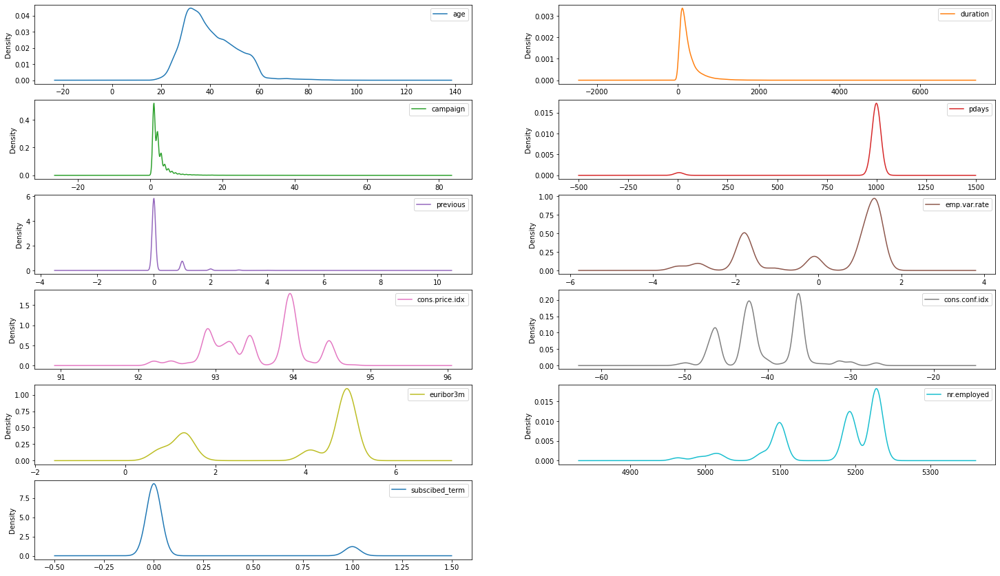

In [28]:
import matplotlib.pyplot as plt
bank_mark_df[final_numeric_feature].plot(kind='density', subplots=True, layout=(10,2), sharex=False, figsize= (25,25))
plt.show()

## Preprocessing

In [29]:
import pandas_profiling as pp
pp.ProfileReport(bank_mark_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [30]:
bank_mark_df.isnull().values.any() #checking if there any null values in data

False

In [31]:
bank_mark_df.drop_duplicates(inplace=True)

## Exploratory Data Analysis

Job


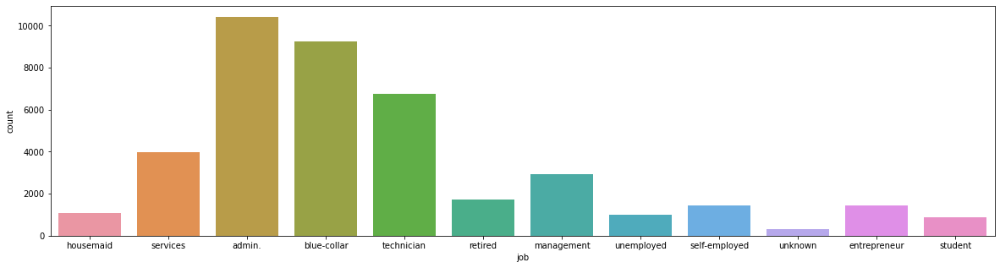

Marital


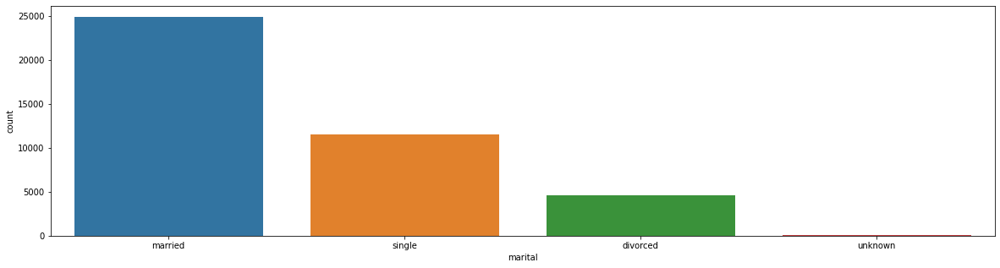

Education


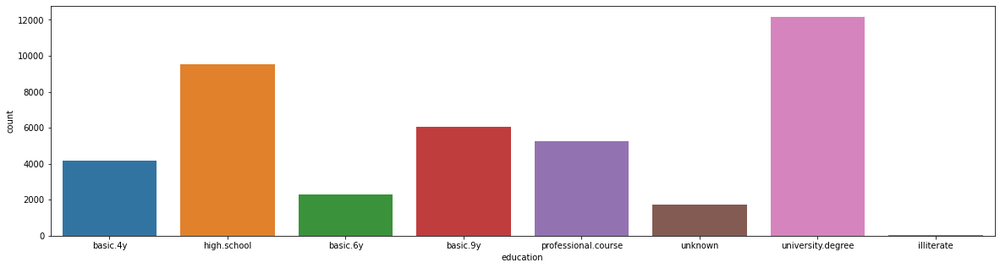

Default


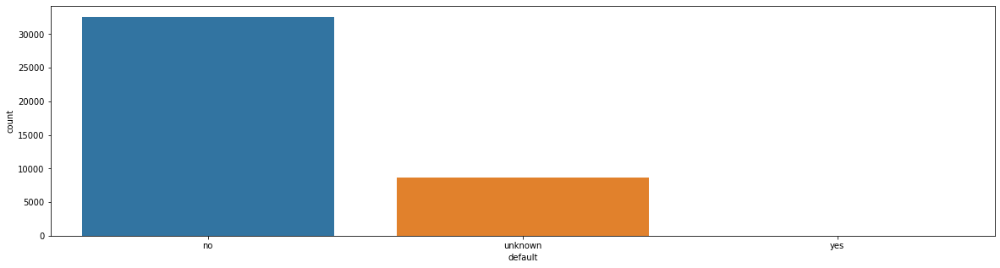

Housing


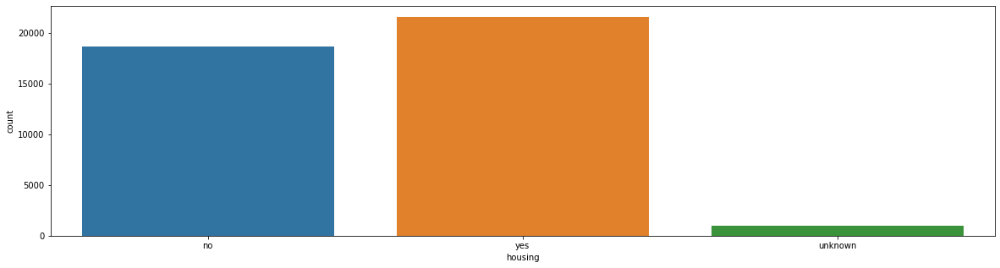

Loan


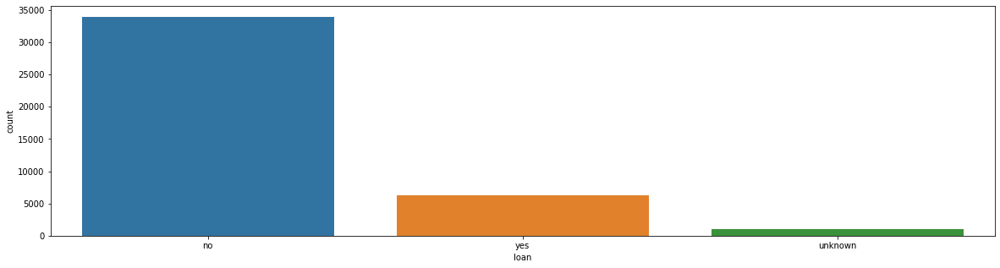

Contact


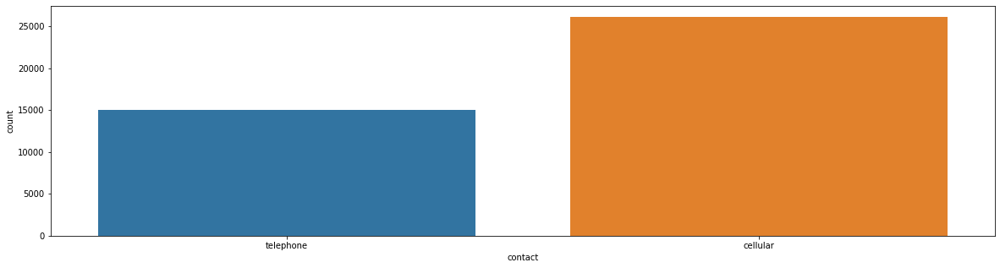

Month


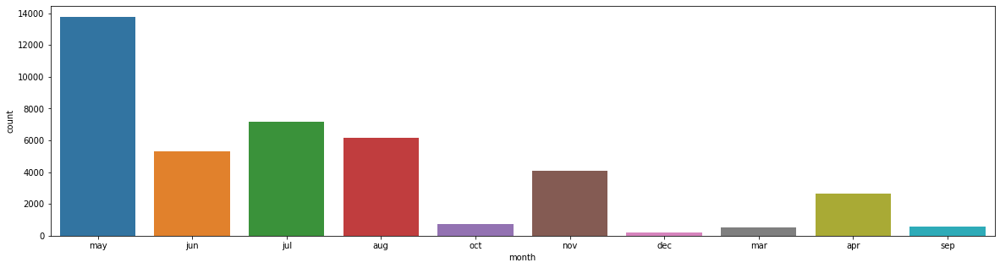

Day_Of_Week


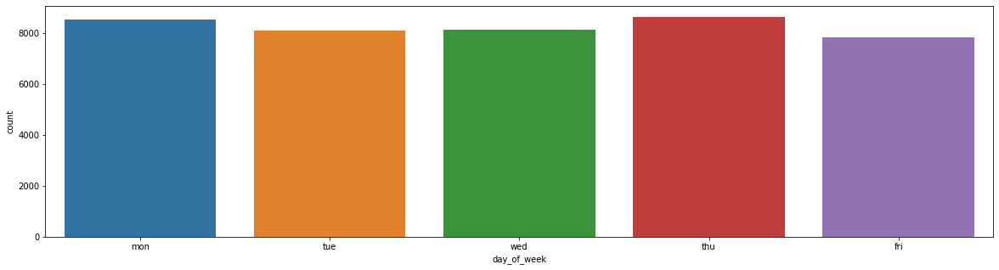

Poutcome


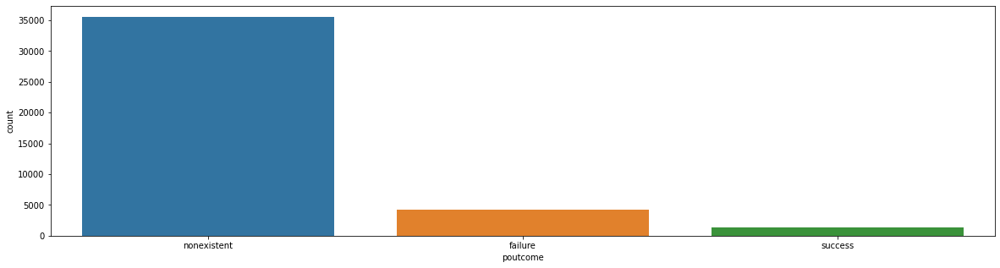

In [32]:
import seaborn as sns
for column in final_categorical_feature:
    plt.figure(figsize=(20, 5))
    print(column.title())
    ax = sns.countplot(x = bank_mark_df[column])
    plt.show()

In [33]:
print("Number of people with credit default: ", bank_mark_df[bank_mark_df['default'] == 'yes']['default'].count())
print("Number of people with no credit default: ", bank_mark_df[bank_mark_df['default'] == 'no']['default'].count())
print("Number of people who's credit default is unknown: ", bank_mark_df[bank_mark_df['default'] == 'unknown']['default'].count())

Number of people with credit default:  3
Number of people with no credit default:  32577
Number of people who's credit default is unknown:  8596


In [34]:
import plotly.express as px
fig = px.histogram(bank_mark_df, x="default", color="subscibed_term", barmode="group", title="<i>The impact of default on term deposits<i>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

As you can see Default has no impact on the client subscribing a term deposit. 

In [35]:
bank_mark_df.drop(["default"], axis = 1, inplace=True)

In [36]:
bank_mark_df.head(3)

,age,job,marital,education,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscibed_term
0,56,housemaid,married,basic.4y,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
1,57,services,married,high.school,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
2,37,services,married,high.school,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0


In [37]:
bank_mark_df["subscibed_term"][bank_mark_df["subscibed_term"]== 0].groupby(by=bank_mark_df["job"]).value_counts()

job            subscibed_term
admin.         0                 9068
blue-collar    0                 8615
entrepreneur   0                 1332
housemaid      0                  954
management     0                 2596
retired        0                 1284
self-employed  0                 1272
services       0                 3644
student        0                  600
technician     0                 6009
unemployed     0                  870
unknown        0                  293
Name: subscibed_term, dtype: int64

In [38]:
bank_mark_df["subscibed_term"][bank_mark_df["subscibed_term"]== 1].groupby(by=bank_mark_df["job"]).value_counts()

job            subscibed_term
admin.         1                 1351
blue-collar    1                  638
entrepreneur   1                  124
housemaid      1                  106
management     1                  328
retired        1                  434
self-employed  1                  149
services       1                  323
student        1                  275
technician     1                  730
unemployed     1                  144
unknown        1                   37
Name: subscibed_term, dtype: int64

In [39]:
import plotly.express as px
fig = px.histogram(bank_mark_df, x="job", color="subscibed_term", barmode="group", title="<i>The impact of job on term deposits<i>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

Highest Number of application are from admin type of job.

In [40]:
bank_mark_df["subscibed_term"][bank_mark_df["subscibed_term"]== 1].groupby(by=bank_mark_df["marital"]).value_counts()

marital   subscibed_term
divorced  1                  476
married   1                 2531
single    1                 1620
unknown   1                   12
Name: subscibed_term, dtype: int64

In [41]:
import plotly.graph_objects as go

labels = bank_mark_df['marital'].unique()
values = bank_mark_df['marital'].value_counts()

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.4)])
fig.update_layout(title_text="<i>marital distribution<i>")
fig.show()

In [42]:
import plotly.express as px
color_map = {1: "#82E0AA", 0: "#85C1E9"}
fig = px.histogram(bank_mark_df, x="marital", color="subscibed_term", barmode="group", title="<b>impact marital status on term deposit offers </b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

Most of the clients who applied for a term deposit were married. 

In [43]:
bank_mark_df.head(2)

,age,job,marital,education,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscibed_term
0,56,housemaid,married,basic.4y,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
1,57,services,married,high.school,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0


In [44]:
import plotly.express as px
color_map = {1: "#82E0AA", 0: "#85C1E9"}
fig = px.histogram(bank_mark_df, x="education", color="subscibed_term", barmode="group", title="<b>impact education on term deposit offers </b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

Clients with university degree and high school were approached more as compare to other.

In [45]:
import plotly.express as px
color_map = {1: "#82E0AA", 0: "#85C1E9"}
fig = px.histogram(bank_mark_df, x="housing", color="subscibed_term", barmode="group", title="<b>impact of housing loan on term deposit offers </b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

Housing loan does not have much effect on the number of term deposit purchased.

In [46]:
bank_mark_df.drop(["housing"], axis = 1, inplace=True)

In [47]:
import plotly.express as px
color_map = {1: "#82E0AA", 0: "#85C1E9"}
fig = px.histogram(bank_mark_df, x="loan", color="subscibed_term", barmode="group", title="<b>impact of having personal loan on term deposit offers </b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

Most of the clients who have applied for a term deposit do not have loans.

In [48]:
import plotly.express as px
import matplotlib.ticker as mtick
color_map = {1: "#17FF00", 0: "#FF0032"}
fig = px.histogram(bank_mark_df, x="contact", color="subscibed_term", barmode="group", title="<b>impact of contact type on term deposit offers </b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [49]:
import plotly.express as px
import matplotlib.ticker as mtick
color_map = {1: "#17FF00", 0: "#FF0032"}
fig = px.histogram(bank_mark_df, x="month", color="subscibed_term", barmode="group", title="<b>impact of month on term deposit offers </b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In January, Febuary we don't have data or no one was approached. Most of the applications were made in May and throughout the summer.

In [50]:
import plotly.express as px
import matplotlib.ticker as mtick
color_map = {1: "#17FF00", 0: "#FF0032"}
fig = px.histogram(bank_mark_df, x="day_of_week", color="subscibed_term", barmode="group", title="<b>impact the day of week on term deposit offers </b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

There is no significant different in the number of client approached and number of people subscribed.

In [51]:
bank_mark_df.drop(["day_of_week"], axis = 1, inplace=True)

In [52]:
import plotly.express as px
import matplotlib.ticker as mtick
color_map = {1: "#17FF00", 0: "#FF0032"}
fig = px.histogram(bank_mark_df, x="poutcome", color="subscibed_term", barmode="group", title="<b>impact the outcome of the previous marketing campaign on term deposit offers </b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [53]:
categorical_feature = bank_mark_df.dtypes==object
final_categorical_feature = bank_mark_df.columns[categorical_feature].tolist()

#..........................................................................
numeric_feature = bank_mark_df.dtypes!=object
final_numeric_feature = bank_mark_df.columns[numeric_feature].tolist()

In [54]:
final_categorical_feature

['job', 'marital', 'education', 'loan', 'contact', 'month', 'poutcome']

In [55]:
final_numeric_feature

['age',
 'duration',
 'campaign',
 'pdays',
 'previous',
 'emp.var.rate',
 'cons.price.idx',
 'cons.conf.idx',
 'euribor3m',
 'nr.employed',
 'subscibed_term']

In [56]:
bank_mark_df.head(2)

,age,job,marital,education,loan,contact,month,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscibed_term
0,56,housemaid,married,basic.4y,no,telephone,may,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
1,57,services,married,high.school,no,telephone,may,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0


In [57]:
min_duration = bank_mark_df['duration'].min()
max_duration = bank_mark_df['duration'].max()
median_duration = bank_mark_df['duration'].mean()
standard_dev_duration = bank_mark_df["duration"].std()

print("Min call duration in seconds: ", min_duration)
print("Max call duration in seconds: ", max_duration)
print("Median call duration in seconds: ", round(median_duration, 2))
print("Standard diveation in call duration in seconds: ", round(standard_dev_duration, 2))

Min call duration in seconds:  0
Max call duration in seconds:  4918
Median call duration in seconds:  258.32
Standard diveation in call duration in seconds:  259.31


c:\Users\Telli\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_core.py:1326: UserWarning:

Vertical orientation ignored with only `x` specified.

c:\Users\Telli\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Call Duration vs Count')

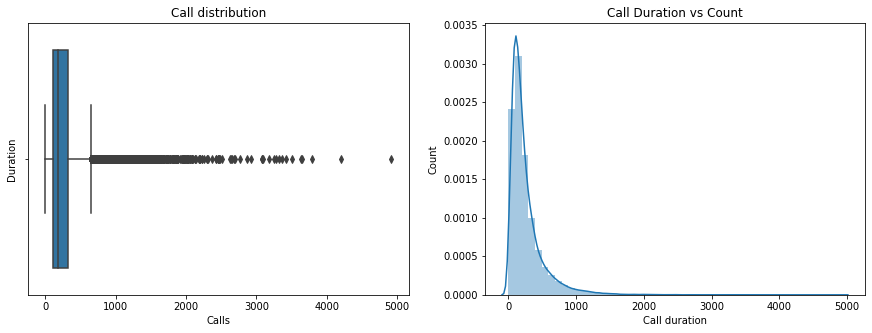

In [58]:
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (15, 5))

sns.boxplot(x = "duration", data = bank_mark_df, orient = 'v', ax = ax1)
ax1.set_xlabel("Calls")
ax1.set_ylabel("Duration")
ax1.set_title("Call distribution")

sns.distplot(bank_mark_df['duration'], ax = ax2)
ax2.set_xlabel("Call duration")
ax2.set_ylabel("Count")
ax2.set_title("Call Duration vs Count")

Most call duration is around the mean so finding the interquartile range will help us in understanding how long the call might last

A measure of spread gives us an idea of how well the mean, for example, represents the data. If the spread of values in the data set is large, the mean is not as representative of the data as if the spread of data is small.


In [59]:
import numpy as np
copy_df = bank_mark_df.copy()
# Quantiles
for column in final_numeric_feature:
    first_quantile = copy_df[column].quantile(q = 0.25)
    second_quantile = copy_df[column].quantile(q = 0.50)
    third_quantile = copy_df[column].quantile(q = 0.75)
    iqr = third_quantile - first_quantile
    lower_hence = first_quantile - (1.5*iqr)
    upper_fence = third_quantile - (1.5*iqr)
    print(f'For {column}:')
    print('1º Quartile:', first_quantile)
    print('2º Quartile:', second_quantile)
    print('3º Quartile:', third_quantile)
    print('IQR:', iqr)
    print (lower_hence)
    print(upper_fence)
    print('...........................')
new_df2 = copy_df[copy_df[column].between(lower_hence, upper_fence)]
#Values below the lower fence and above the upper fence are potential outliers that you should investigate

For age:
1º Quartile: 32.0
2º Quartile: 38.0
3º Quartile: 47.0
IQR: 15.0
9.5
24.5
...........................
For duration:
1º Quartile: 102.0
2º Quartile: 180.0
3º Quartile: 319.0
IQR: 217.0
-223.5
-6.5
...........................
For campaign:
1º Quartile: 1.0
2º Quartile: 2.0
3º Quartile: 3.0
IQR: 2.0
-2.0
0.0
...........................
For pdays:
1º Quartile: 999.0
2º Quartile: 999.0
3º Quartile: 999.0
IQR: 0.0
999.0
999.0
...........................
For previous:
1º Quartile: 0.0
2º Quartile: 0.0
3º Quartile: 0.0
IQR: 0.0
0.0
0.0
...........................
For emp.var.rate:
1º Quartile: -1.8
2º Quartile: 1.1
3º Quartile: 1.4
IQR: 3.2
-6.6000000000000005
-3.400000000000001
...........................
For cons.price.idx:
1º Quartile: 93.075
2º Quartile: 93.749
3º Quartile: 93.994
IQR: 0.9189999999999969
91.69650000000001
92.6155
...........................
For cons.conf.idx:
1º Quartile: -42.7
2º Quartile: -41.8
3º Quartile: -36.4
IQR: 6.300000000000004
-52.150000000000006
-45.850

Finding the interquartile range will help us in understanding how long the call might last. So in our case it is 217 sec.

In [60]:
copy_df.tail(3)

,age,job,marital,education,loan,contact,month,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscibed_term
41185,56,retired,married,university.degree,no,cellular,nov,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0
41186,44,technician,married,professional.course,no,cellular,nov,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1
41187,74,retired,married,professional.course,no,cellular,nov,239,3,999,1,failure,-1.1,94.767,-50.8,1.028,4963.6,0


In [61]:
copy_df['subscibed_term'].value_counts()

0    36537
1     4639
Name: subscibed_term, dtype: int64

In [62]:
copy_df.shape

(41176, 18)

In [63]:
bank_mark_df.tail(3)

,age,job,marital,education,loan,contact,month,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscibed_term
41185,56,retired,married,university.degree,no,cellular,nov,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0
41186,44,technician,married,professional.course,no,cellular,nov,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1
41187,74,retired,married,professional.course,no,cellular,nov,239,3,999,1,failure,-1.1,94.767,-50.8,1.028,4963.6,0


In [64]:
bank_mark_df.shape

(41176, 18)

Duration is known before the call is performed. Only after the end of call you know if it is your term deposit client or not. This data should be there purely for the sake of understanding, but since our final goal is to build a model that suggests the probability of a term deposit, we do not really need this data.

In [65]:
duration = copy_df["duration"]
copy_df.drop(["duration"], axis = 1, inplace=True)

In [66]:
categorical_feature = copy_df.dtypes==object
final_categorical_feature = copy_df.columns[categorical_feature].tolist()

#..........................................................................
numeric_feature = copy_df.dtypes!=object
final_numeric_feature = copy_df.columns[numeric_feature].tolist()

In [67]:
final_categorical_feature

['job', 'marital', 'education', 'loan', 'contact', 'month', 'poutcome']

In [68]:
final_numeric_feature

['age',
 'campaign',
 'pdays',
 'previous',
 'emp.var.rate',
 'cons.price.idx',
 'cons.conf.idx',
 'euribor3m',
 'nr.employed',
 'subscibed_term']

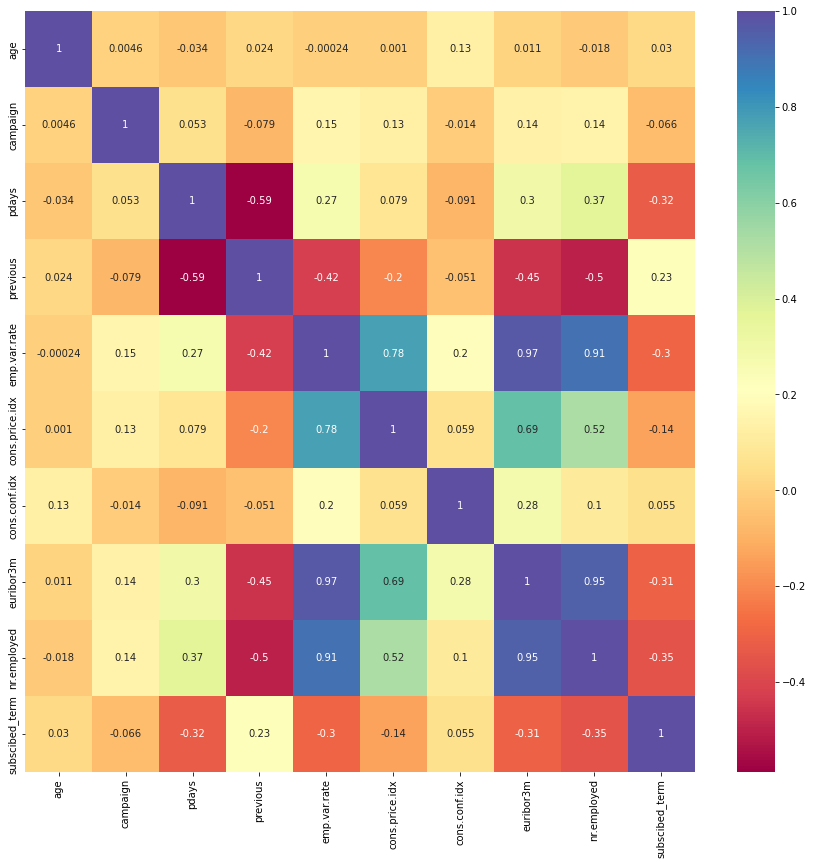

In [69]:
plt.figure(figsize=(15, 14))
sns.heatmap(copy_df.corr(), annot=True, cmap='Spectral')
plt.show()

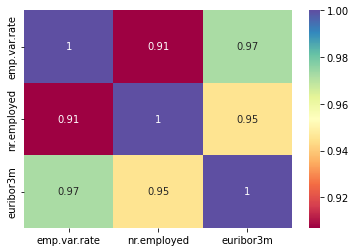

In [70]:
sns.heatmap(copy_df[["emp.var.rate", "nr.employed", "euribor3m"]].corr(), annot=True, cmap='Spectral') #Handle highly correlated variables
plt.show()

Euribor3m: euribor 3 month rate - daily indicator (numeric). It is the acronym for the Euro Interbank Offered Rate, which is often referred to as “the price of money”. We can see that employment variation rate and number of employees are high positively correlated with with each other and with the Euro Interbank Offered Rate. So we will drop 'emp.var.rate' and 'nr.employed' as 'euribor' also give us the price of money in current market.

In [71]:
copy_df.drop(['emp.var.rate', 'nr.employed'], axis = 1, inplace=True)

In [72]:
categorical_feature = copy_df.dtypes==object
final_categorical_feature = copy_df.columns[categorical_feature].tolist()

#..........................................................................
numeric_feature = copy_df.dtypes!=object
final_numeric_feature = copy_df.columns[numeric_feature].tolist()

In [73]:
final_numeric_feature

['age',
 'campaign',
 'pdays',
 'previous',
 'cons.price.idx',
 'cons.conf.idx',
 'euribor3m',
 'subscibed_term']

In [74]:
import plotly.express as px
import matplotlib.ticker as mtick
color_map = {1: "#17FF00", 0: "#FF0032"}
fig = px.histogram(bank_mark_df, x="campaign", color="subscibed_term", barmode="group", title="<b>impact the number of contact on term deposit offers </b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

If the number of contacts performed during this campaign and for this client become more than 18 then there is very high possibility that client will not subscribe for term deposit. Even if we contact a person more than 8 times probability is still low.

In [75]:
copy_df.drop(copy_df[copy_df.campaign>8].index, inplace=True)

In [76]:
import plotly.express as px
import matplotlib.ticker as mtick
color_map = {1: "#17FF00", 0: "#FF0032"}
fig = px.histogram(bank_mark_df, x="age", color="subscibed_term", barmode="group", title="<b>impact the age of client on term deposit offers </b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

Our graph shows that after 60 the client is more likely not to turn to a time deposit.

In [77]:
copy_df.drop(copy_df[copy_df.age>60].index, inplace=True)

In [78]:
categorical_feature = copy_df.dtypes==object
final_categorical_feature = copy_df.columns[categorical_feature].tolist()

#..........................................................................
numeric_feature = copy_df.dtypes!=object
final_numeric_feature = copy_df.columns[numeric_feature].tolist()

In [79]:
import plotly.express as px
import matplotlib.ticker as mtick
color_map = {1: "#17FF00", 0: "#FF0032"}
fig = px.histogram(bank_mark_df, x="pdays", color="subscibed_term", barmode="group", title="<b>impact the days from a previous campaign on term deposit offers </b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

If we start contacting client 1 month before campaign there is high probability of that client subscribing.

In [80]:
final_categorical_feature

['job', 'marital', 'education', 'loan', 'contact', 'month', 'poutcome']

## One Hot Encoding for categorical variables

In [81]:
job = pd.get_dummies(copy_df.job, drop_first=True)
marital = pd.get_dummies(copy_df.marital, drop_first=True)
education = pd.get_dummies(copy_df.education, drop_first=True)
loan = pd.get_dummies(copy_df.loan, drop_first=True)
contact = pd.get_dummies(copy_df.contact, drop_first=True)
month = pd.get_dummies(copy_df.month, drop_first=True)
poutcome = pd.get_dummies(copy_df.poutcome, drop_first=True)

In [82]:
copy_df = pd.concat([copy_df, job, marital , education, loan, contact, month, poutcome], axis=1)
copy_df.head()

,age,job,marital,education,loan,contact,month,campaign,pdays,previous,...,dec,jul,jun,mar,may,nov,oct,sep,nonexistent,success
0,56,housemaid,married,basic.4y,no,telephone,may,1,999,0,...,0,0,0,0,1,0,0,0,1,0
1,57,services,married,high.school,no,telephone,may,1,999,0,...,0,0,0,0,1,0,0,0,1,0
2,37,services,married,high.school,no,telephone,may,1,999,0,...,0,0,0,0,1,0,0,0,1,0
3,40,admin.,married,basic.6y,no,telephone,may,1,999,0,...,0,0,0,0,1,0,0,0,1,0
4,56,services,married,high.school,yes,telephone,may,1,999,0,...,0,0,0,0,1,0,0,0,1,0


In [83]:
copy_df.drop(['job', 'marital' , 'education', 'loan', 'contact', 'month', 'poutcome'], axis = 1, inplace = True)
copy_df.head()

,age,campaign,pdays,previous,cons.price.idx,cons.conf.idx,euribor3m,subscibed_term,blue-collar,entrepreneur,...,dec,jul,jun,mar,may,nov,oct,sep,nonexistent,success
0,56,1,999,0,93.994,-36.4,4.857,0,0,0,...,0,0,0,0,1,0,0,0,1,0
1,57,1,999,0,93.994,-36.4,4.857,0,0,0,...,0,0,0,0,1,0,0,0,1,0
2,37,1,999,0,93.994,-36.4,4.857,0,0,0,...,0,0,0,0,1,0,0,0,1,0
3,40,1,999,0,93.994,-36.4,4.857,0,0,0,...,0,0,0,0,1,0,0,0,1,0
4,56,1,999,0,93.994,-36.4,4.857,0,0,0,...,0,0,0,0,1,0,0,0,1,0


In [84]:
categorical_feature = copy_df.dtypes==object
final_categorical_feature = copy_df.columns[categorical_feature].tolist()

#..........................................................................
numeric_feature = copy_df.dtypes!=object
final_numeric_feature = copy_df.columns[numeric_feature].tolist()

In [85]:
final_categorical_feature #there is no categorical feature 

[]

## Modelling

#### Balancing data

In [120]:
X = copy_df.drop("subscibed_term", axis = 1)
y = copy_df['subscibed_term']

In [121]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
print(y_train.value_counts())

scale = MinMaxScaler()
col = X_train.columns

X_train[col] = scale.fit_transform(X_train[col])
X_test[col] = scale.transform(X_test[col])

0    24275
1     2953
Name: subscibed_term, dtype: int64


In [122]:
df_train = pd.DataFrame(X_train)
df_train.head()

,age,campaign,pdays,previous,cons.price.idx,cons.conf.idx,euribor3m,blue-collar,entrepreneur,housemaid,...,dec,jul,jun,mar,may,nov,oct,sep,nonexistent,success
12614,0.627907,0.142857,1.0,0.000000,0.669135,0.338912,0.980730,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
31218,0.488372,0.000000,1.0,0.000000,0.269680,0.192469,0.158694,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
7353,0.441860,0.285714,1.0,0.000000,0.698753,0.602510,0.958966,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
32756,0.534884,0.142857,1.0,0.142857,0.269680,0.192469,0.150759,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
18511,0.395349,0.000000,1.0,0.000000,0.669135,0.338912,0.982544,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [123]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score,recall_score, precision_score
from sklearn.metrics import confusion_matrix, classification_report
lr_model = LogisticRegression()
lr_model.fit(X_train,y_train)
accuracy_lr = lr_model.score(X_test,y_test)
print("Logistic Regression accuracy is :",accuracy_lr)

Logistic Regression accuracy is : 0.9021422450728364


In [124]:
lr_pred= lr_model.predict(X_test)
report = classification_report(y_test,lr_pred)
print(report)

              precision    recall  f1-score   support

           0       0.91      0.99      0.95     10453
           1       0.60      0.19      0.29      1217

    accuracy                           0.90     11670
   macro avg       0.75      0.59      0.62     11670
weighted avg       0.88      0.90      0.88     11670



In [125]:
print( np.unique( lr_pred ) ) #checking if it is predicting only 1 class


[0 1]


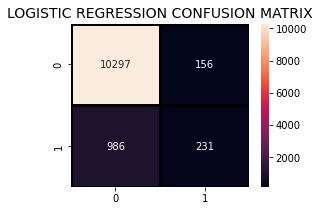

In [126]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, lr_pred),
                annot=True,fmt = "d",linecolor="k",linewidths=3)
    
plt.title("LOGISTIC REGRESSION CONFUSION MATRIX",fontsize=14)
plt.show()

c:\Users\Telli\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.



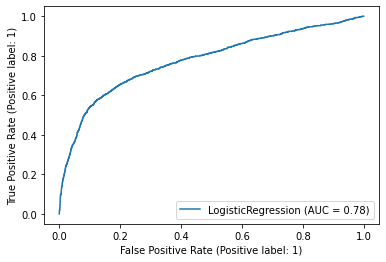

In [127]:
from sklearn.metrics import plot_confusion_matrix, plot_roc_curve
disp = plot_roc_curve(lr_model, X_test, y_test)
disp

# Try Random Forests

In [128]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

X_train, X_test, y_train, y_test = train_test_split(
    X_train, y_train, test_size=0.25, random_state=42
)

model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)
preds = model.predict(X_test)
print (metrics.accuracy_score(y_test, preds))

0.8855589833994417


In [129]:
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.91      0.96      0.94      6054
           1       0.47      0.27      0.34       753

    accuracy                           0.89      6807
   macro avg       0.69      0.61      0.64      6807
weighted avg       0.86      0.89      0.87      6807



# Try Decision Tree Classifier

In [130]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.84031144410166


In [131]:
print(classification_report(y_test, predictdt_y))


              precision    recall  f1-score   support

           0       0.91      0.91      0.91      6054
           1       0.29      0.30      0.29       753

    accuracy                           0.84      6807
   macro avg       0.60      0.60      0.60      6807
weighted avg       0.84      0.84      0.84      6807



# Try KNN Classifier

In [132]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors = 11) 
knn_model.fit(X_train,y_train)
predicted_y = knn_model.predict(X_test)
accuracy_knn = knn_model.score(X_test,y_test)
print("KNN accuracy:",accuracy_knn)

KNN accuracy: 0.8949610694872925


In [133]:
print(classification_report(y_test, predicted_y))


              precision    recall  f1-score   support

           0       0.91      0.98      0.94      6054
           1       0.58      0.19      0.29       753

    accuracy                           0.89      6807
   macro avg       0.74      0.59      0.62      6807
weighted avg       0.87      0.89      0.87      6807



# Try SVC Classifier

In [100]:
from sklearn.svm import SVC
svc_model = SVC(random_state = 1)
svc_model.fit(X_train,y_train)
predict_y = svc_model.predict(X_test)
accuracy_svc = svc_model.score(X_test,y_test)
print("SVM accuracy is :",accuracy_svc)

SVM accuracy is : 0.9071543998824739


In [101]:
print(classification_report(y_test, predict_y))


              precision    recall  f1-score   support

           0       0.91      0.99      0.95      6092
           1       0.72      0.19      0.30       715

    accuracy                           0.91      6807
   macro avg       0.81      0.59      0.63      6807
weighted avg       0.89      0.91      0.88      6807



In [102]:
from sklearn.metrics import confusion_matrix

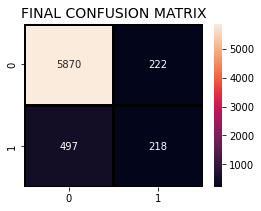

In [103]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, preds),
                annot=True,fmt = "d",linecolor="k",linewidths=3)
    
plt.title("FINAL CONFUSION MATRIX",fontsize=14)
plt.show()

## Try AdaBoost Classifier

In [104]:
from sklearn.ensemble import AdaBoostClassifier
a_model = AdaBoostClassifier()
a_model.fit(X_train,y_train)
a_preds = a_model.predict(X_test)
print("AdaBoost Classifier accuracy")
metrics.accuracy_score(y_test, a_preds)

AdaBoost Classifier accuracy


0.9073013074775966

In [105]:
print(classification_report(y_test, a_preds))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95      6092
           1       0.68      0.22      0.33       715

    accuracy                           0.91      6807
   macro avg       0.80      0.60      0.64      6807
weighted avg       0.89      0.91      0.89      6807



## Trying Gradient Boosting Classifier

In [106]:
from sklearn.ensemble import GradientBoostingClassifier
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)
gb_pred = gb.predict(X_test)
print("Gradient Boosting Classifier", accuracy_score(y_test, gb_pred))

Gradient Boosting Classifier 0.9081827530483326


In [107]:
print(classification_report(y_test, gb_pred))

              precision    recall  f1-score   support

           0       0.92      0.98      0.95      6092
           1       0.64      0.28      0.39       715

    accuracy                           0.91      6807
   macro avg       0.78      0.63      0.67      6807
weighted avg       0.89      0.91      0.89      6807



## Try Voting Classifier

In [108]:
from sklearn.ensemble import VotingClassifier
clf1 = GradientBoostingClassifier()
clf2 = LogisticRegression()
clf3 = AdaBoostClassifier()
eclf1 = VotingClassifier(estimators=[('gbc', clf1), ('lr', clf2), ('abc', clf3)], voting='soft')
eclf1.fit(X_train, y_train)
predictions = eclf1.predict(X_test)
print("Final Accuracy Score ")
print(accuracy_score(y_test, predictions))

Final Accuracy Score 
0.9059791391214925


In [109]:
print(classification_report(y_test, predictions))


              precision    recall  f1-score   support

           0       0.92      0.98      0.95      6092
           1       0.64      0.24      0.35       715

    accuracy                           0.91      6807
   macro avg       0.78      0.61      0.65      6807
weighted avg       0.89      0.91      0.89      6807



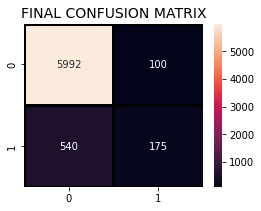

In [110]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, predictions),
                annot=True,fmt = "d",linecolor="k",linewidths=3)
    
plt.title("FINAL CONFUSION MATRIX",fontsize=14)
plt.show()